In [1]:

import matplotlib.pyplot as plt
from tsfresh import extract_features
from tsfresh import select_features
from tsfresh.utilities.dataframe_functions import impute
from tsfresh import extract_relevant_features
from scipy.fft import fft, ifft
from scipy import signal
import seaborn as sns
import numpy as np
import pywt
import statsmodels.api as sm
import csv
import os
import pandas as pd
from tsfresh.feature_extraction import ComprehensiveFCParameters
%matplotlib inline
import pandas as pd # for using pandas daraframe
import numpy as np # for som math operations
from sklearn.preprocessing import StandardScaler # for standardizing the Data
from sklearn.decomposition import PCA # for PCA calculation
import matplotlib.pyplot as plt # for plotting

print(os.getcwd())


To do:

1. Thre name change of directory, compil list to be replaced
2. Scaling in plotting 
3. Change plotting param for welding gas and speed
4. 1.1 Add Permutation Entropy, Sample Entropy for 0.04, 0.02, 0.01 sec. Analysis

Specify file to be anaylized path

In [ ]:
wall_no = 'wall 1'

working_direc = 'xyz'
#pf = pd.read_csv(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\211216_steel_wall2 (1)\211216_steel_wall2\print-e6c5e2dc.csv')
pf = pd.read_csv(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Walls_data\211216_steel_wall2 (1)\211216_steel_wall2\print-e6c5e2dc.csv')
#print(pf.head()) 
time2 = pf.iloc[0,1]
#pf['time'] = pf['time'].apply(lambda x:  (x - time2) / 10 ** 9)

#plt.plot(pf.iloc[3578865:3579025].dropna(subset = ['voltage'])['time'], pf['voltage'].iloc[3578865:3579025].dropna())
    
#plt.plot(pf.iloc[9073734:9073894].dropna(subset = ['voltage'])['time'], pf['voltage'].iloc[9073734:9073894].dropna())
# x = 100
# for i in range (1,30):
#     if pf['time'].iloc[3582865 + x * i] - pf['time'].iloc[3578865] > float(1):
#         print(3582865 + x * i)
#         break

#print(pf['voltage'].iloc[3578865:3584065].count())
#print(pf.iloc[3578865].dropna(subset = ['voltage'])['time'] - pf.iloc[3582865].dropna(subset = ['voltage'])['time'])
#     pf['time'].iloc[3578865], pf.iloc[130689: 207493].dropna(subset = ['voltage'])[]


# y2 = fft(pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna().to_numpy())
# time_y2 =  pf.iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']

#pf.iloc[130689: 207493].dropna(subset = ['voltage'])

#plt.show()

# '''

# no1 = int((pf['time'].iloc[100639 - 8000] -  pf['time'].iloc[23897 + 8000]) / 0.08)

# no2 = int((pf['time'].iloc[577724 -8000] -  pf['time'].iloc[494490 + 8000]) / 0.08)

# print(no1, no2) ----------> 149 165

# '''

In [ ]:
#plt.plot(pf.iloc[9579018:9579178].dropna(subset = ['voltage'])['time'], pf['voltage'].iloc[9579018:9579178].dropna())
#pf['time'].iloc[130689:130700]

Using logic to get the data of each layer start and end by using r20, r21 parameter values. Finally code to save time stamp data mapped with layer number to CSV file is written to retrieve data next time easily.

In [ ]:


# list_of_stable_print = []
# for i in range(100):
#     if i == 0:
#         data = pf.loc[(pf['welding_real'] == 1) & (pf['welding_command'] == 1) & (pf['velocity'] != 0) & (pf.index > int(0))].first_valid_index()
#         print(data)
#     else: 
#         data = pf.loc[(pf['welding_real'] == 1) & (pf['welding_command'] == 1) & (pf['velocity'] != 0) & (pf.index > int(list_of_stable_print[(2*i) - 1]))].first_valid_index()

#     if not data:
#         break
#     else:
#         data_end = pf.loc[( (pf['welding_real'] == 0) | (pf['welding_command'] == 0) | (pf['velocity'] == 0)) & (pf.index >  int(data)) ].first_valid_index()
  

#     list_of_stable_print.append(int(data))
#     list_of_stable_print.append(int(data_end))

# # data1 = pf.loc[(pf['welding_real'] == 1) & (pf['welding_command'] == 1) & (pf['velocity'] != 0) & (pf.index > data_end)].first_valid_index()
# # data_end1 = pf.loc[( (pf['welding_real'] == 0) | (pf['welding_command'] == 0) | (pf['velocity'] == 0)) & (pf.index > int(data1)) ].first_valid_index()
# # print(data1, data_end1)
# print(list_of_stable_print)

#path = os.path.join(working_direc, 'layer_timestamp_info')


# with open('path', 'w', newline='') as student_file:
#     writer = csv.writer(student_file)
#     writer.writerow(list_of_stable_print)


#print(pf.iloc[-1,1]-time2)

Cross checking if Tsfresh calculates features correctly.

In [ ]:

# '''
# x = pf['voltage'].iloc[3333746 + 8000: 3410528 - 8000].sum() #layer 24

# y = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\Tsfreshfeatures_0.16\feature24.xlsx')['voltage__sum_values'].sum()

# print(x,y)    --------> 76815.86160654417 76811.93576505297

# '''



In [ ]:
file = open(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\students.csv', "r")
csv_reader = csv.reader(file)

list_of_stable_print1 = []
for row in csv_reader:
    list_of_stable_print1.append(row)

list_of_stable_print1[0] = [ int(x) for x in list_of_stable_print1[0] ]
list_of_stable_print = list_of_stable_print1[0]
print(list_of_stable_print)
print(len(list_of_stable_print))

[23897, 100639, 130689, 207493, 242442, 319254, 335725, 412748, 494490, 577724, 621086, 697878, 742064, 818884, 857534, 934454, 1399475, 1476479, 1504489, 1581533, 1626885, 1703626, 1733377, 1810166, 1898273, 1975342, 2002770, 2079839, 2142836, 2219611, 2258068, 2334818, 2393182, 2470108, 2506791, 2583907, 2669155, 2745942, 2791565, 2868390, 2928765, 3005561, 3058703, 3135484, 3217808, 3294724, 3333746, 3410528, 3460476, 3537337, 3574865, 3651603, 3737392, 3814488, 3865319, 3941975, 4008174, 4085276, 4136675, 4213804, 4313122, 4389961, 4435603, 4512633, 4588594, 4665404, 4719706, 4796554, 4874563, 4951685, 5008315, 5085004, 5202278, 5279199, 5326262, 5402984, 5473435, 5550309, 5612689, 5689722, 5771148, 5848494, 6402541, 6479314, 6561900, 6639026, 6673990, 6751272, 6807638, 6884436, 6920856, 6997600, 7098139, 7174810, 7220474, 7297227, 7375525, 7452221, 7525623, 7602524, 7690653, 7767587, 7885722, 7962688, 8027381, 8104296, 8175058, 8251904, 8302157, 8379143, 8430570, 8507371, 8838105,

In [ ]:


layer = {}


length_list = 67
for i in range(1, int(length_list) + 1):
   layer[i] = []


key_layers = list(layer)
for i in range(len(layer)): 
    layer[key_layers[i]].append(list_of_stable_print[2*key_layers[i]-2])
    layer[key_layers[i]].append(list_of_stable_print[2*key_layers[i]-1])

print(layer)
    

{1: [23897, 100639], 2: [130689, 207493], 3: [242442, 319254], 4: [335725, 412748], 5: [494490, 577724], 6: [621086, 697878], 7: [742064, 818884], 8: [857534, 934454], 9: [1399475, 1476479], 10: [1504489, 1581533], 11: [1626885, 1703626], 12: [1733377, 1810166], 13: [1898273, 1975342], 14: [2002770, 2079839], 15: [2142836, 2219611], 16: [2258068, 2334818], 17: [2393182, 2470108], 18: [2506791, 2583907], 19: [2669155, 2745942], 20: [2791565, 2868390], 21: [2928765, 3005561], 22: [3058703, 3135484], 23: [3217808, 3294724], 24: [3333746, 3410528], 25: [3460476, 3537337], 26: [3574865, 3651603], 27: [3737392, 3814488], 28: [3865319, 3941975], 29: [4008174, 4085276], 30: [4136675, 4213804], 31: [4313122, 4389961], 32: [4435603, 4512633], 33: [4588594, 4665404], 34: [4719706, 4796554], 35: [4874563, 4951685], 36: [5008315, 5085004], 37: [5202278, 5279199], 38: [5326262, 5402984], 39: [5473435, 5550309], 40: [5612689, 5689722], 41: [5771148, 5848494], 42: [6402541, 6479314], 43: [6561900, 663

In [ ]:
def portion(layer_no, whichportion, numTimeStamp, reverse, divide):
   if layer_no in layer.keys():
       each_portion_timestamp = int((layer[layer_no][1]- layer[layer_no][0] - 16000) / divide)
       #print(each_portion_timestamp)
       if numTimeStamp == 0:
            numTimeStamp = each_portion_timestamp

       #print(numTimeStamp)

       if reverse:
          start_portion_timestamp = layer[layer_no][0] +  (whichportion)*each_portion_timestamp + 8000
          return [start_portion_timestamp - numTimeStamp, start_portion_timestamp ]
       else: 
          start_portion_timestamp = layer[layer_no][0] +  (whichportion - 1)*each_portion_timestamp + 8000
          return [start_portion_timestamp ,start_portion_timestamp + numTimeStamp]
    


#print(portion(16,2, 200, False, 4 ))      



In [ ]:
def portion_based_on_time(layer_no, time_of_chunk_in_second):
    if layer_no in layer.keys():
        print(pf['time'].iloc[layer[layer_no][1] - 8000])
        print(pf['time'].iloc[layer[layer_no][0] + 8000])
        divide = int((pf['time'].iloc[layer[layer_no][1] - 8000] - pf['time'].iloc[layer[layer_no][0] + 8000]) / time_of_chunk_in_second)
        return divide



-----Make Directory---- Note Automate it

In [ ]:
print(portion_based_on_time(2, 0.08))

39.292720128
27.337420032
149


In [ ]:
# time_chunk = 1
# wall = 'stell_wall_2'


# direc = '{}_{}_sec_data_voltage'.format(wall, time_chunk)

# parent_direc = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\stell_wall_2_1_sec_data_voltage'

# path = os.path.join(parent_direc, direc)
# os.makedirs(path)

In [ ]:


# direc = 'Tsfresh_features'

# parent_direc = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\stell_wall_2_1_sec_data_voltage'

# path = os.path.join(parent_direc, direc)
# os.makedirs(path)

Just specify the 'divide' parameter needed in the layer, will generate xlsx file with chunks for each layer seperately. Note the file paths are important.

In [ ]:
def divide_chunk_data(desired_time_chunk):
    direc = 'stell_wall_2_current{}'.format(desired_time_chunk)
    parent_direc = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc'
    path = os.path.join(parent_direc, direc)
    os.makedirs(path)
    direc = 'chunk_data'
    parent_direc = path
    path1 = os.path.join(parent_direc, direc)
    os.makedirs(path1)
    
    for i in range(1, int(length_list) + 1 ):
        frame_list = []
        divide = portion_based_on_time(i, desired_time_chunk)
        for j in range(1,divide + 1):
            start__timestamp = portion(i,j, 0, False, divide)
            count_nonna = pf['current'].iloc[start__timestamp[0]:start__timestamp[1]].count() 
            data_new = {'id': '{}_{}'.format(i,j),'time':list(range(count_nonna)),  'kind':  'voltage', 'value': pf['voltage'].iloc[start__timestamp[0]:start__timestamp[1]].dropna() }
            df_new1 = pd.DataFrame(data_new)
            frame_list.append(df_new1)
            if j == divide:
                    
                new_dataframe =  pd.concat(frame_list)
                new_dataframe.to_excel(os.path.join(path1, 'test_new{}.xlsx'.format(i)))

In [ ]:
divide_chunk_data(0.08)

In [311]:
# divide_chunk_data(0.02)

In [312]:
# divide_chunk_data(0.01)

TSFresh features of my importance

In [313]:
# settings = ComprehensiveFCParameters()

# feature_of_interest = ['c3', 'abs_energy', 'sample_entropy','approximate_entropy', 'fourier_entropy','matrix_profile', 'benford_correlation', 'cid_ce','kurtosis', 'skewness','sum_values', 'root_mean_square', 'mean_abs_change', 'mean' , 'number_cwt_peaks','variance', 'time_reversal_asymmetry_statistic', 'variation_coefficient', 'standard_deviation']

# dict_of_interest = {}

# for i in range(len(feature_of_interest)):
#     dict_of_interest[feature_of_interest[i]] = settings[feature_of_interest[i]]



Tsfresh feature extraction for each file of chunk data each layer generated in previous code. Please note the file names. Cross check the data.

In [314]:
# def tsfresh_data(desired_time_chunk):
#     direc = 'stell_wall_2_{}'.format(desired_time_chunk)
#     parent_direc = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc'
#     path = os.path.join(parent_direc, direc)

#     direc = 'Tsfresh_features'
#     parent_direc = path
#     path2 = os.path.join(parent_direc, direc)
#     os.makedirs(path2)

#     direc = 'chunk_data'
#     parent_direc = path
#     path1 = os.path.join(parent_direc, direc)
    
#     for i in range(1,int(length_list) + 1):
#         extracted_features = extract_features(pd.read_excel(os.path.join(path1, 'test_new{}.xlsx'.format(i))),column_id="id", column_sort="time", column_kind="kind", column_value="value", default_fc_parameters = dict_of_interest)
#         extracted_features.to_excel(os.path.join(path2,'feature{}.xlsx'.format(i)))


In [315]:
# tsfresh_data(0.04)
# tsfresh_data(0.02)
# tsfresh_data(0.01)

Adding additional features>

In [316]:
main_frame= pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.04.xlsx')
main_frame['max_value'] = 1
for i in range(1, int(length_list) + 1 ):
    if i == 1 or i == 3:
        continue
    test_df =  pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\stell_wall_2_0.04\chunk_data\test_new{}.xlsx'.format(i))
    divide = portion_based_on_time(i, 0.04)
    #print(divide)
    for j in range(1,divide + 1):
        #data_log1.index[data_log1['track number (acoustic)'] == data_5
        max_value_chunk = max(test_df['value'].iloc[test_df.index[test_df['id'] == '{}_{}'.format(i,j)]])
        index_main_frame =main_frame.index[main_frame['Chunk'] == '{}_{}'.format(i,j)]
        main_frame.at[index_main_frame,'max_value'] = max_value_chunk
     

main_frame.to_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.04.xlsx')

39.292720128
27.337420032
79.698513152
67.689730048
112.195169536
98.976489472
135.851623936
123.899035136
159.681000448
147.704040704
182.425053184
170.456252416
289.34441984
277.328439808
310.036411904
298.01889664
334.084471296
322.12929024
355.059771136
343.103866624
387.609279488
375.593584128
408.176124672
396.168422144
435.715860736
423.755975168
458.39741952
446.44989952
485.036731392
473.059649024
507.412059904
495.3941632
539.340956928
527.389279488
563.449161984
551.495474432
590.4675648
578.513249024
616.049544448
604.100443136
647.408792576
635.447320064
670.202816256
658.247067904
695.175968512
683.213149184
717.677658624
705.717716992
749.774223104
737.762806272
774.910078464
762.957657856
803.129005824
791.110849024
828.396599552
816.406653696
863.084504576
851.132261888
887.249479168
875.234941952
917.408780032
905.46133888
943.224229888
931.268019712
973.776378624
961.762929408
1000.048355072
988.1003904
1038.297269504
1026.338258944
1062.693701888
1050.727901696
1091

In [296]:
main_frame= pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0p08.xlsx')
main_frame['max_value'] = 1
for i in range(1, int(length_list) + 1 ):
    if i == 1 or i == 3:
        continue
    test_df =  pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\Features_0.08_seconds\test_new{}.xlsx'.format(i))
    divide = portion_based_on_time(i, 0.08)
    #print(divide)
    for j in range(1,divide + 1):
        #data_log1.index[data_log1['track number (acoustic)'] == data_5
        max_value_chunk = max(test_df['value'].iloc[test_df.index[test_df['id'] == '{}_{}'.format(i,j)]])
        index_main_frame =main_frame.index[main_frame['Chunk'] == '{}_{}'.format(i,j)]
        main_frame.at[index_main_frame,'max_value'] = max_value_chunk
     

main_frame.to_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0p08.xlsx')

39.292720128
27.337420032
79.698513152
67.689730048
112.195169536
98.976489472
135.851623936
123.899035136
159.681000448
147.704040704
182.425053184
170.456252416
289.34441984
277.328439808
310.036411904
298.01889664
334.084471296
322.12929024
355.059771136
343.103866624
387.609279488
375.593584128
408.176124672
396.168422144
435.715860736
423.755975168
458.39741952
446.44989952
485.036731392
473.059649024
507.412059904
495.3941632
539.340956928
527.389279488
563.449161984
551.495474432
590.4675648
578.513249024
616.049544448
604.100443136
647.408792576
635.447320064
670.202816256
658.247067904
695.175968512
683.213149184
717.677658624
705.717716992
749.774223104
737.762806272
774.910078464
762.957657856
803.129005824
791.110849024
828.396599552
816.406653696
863.084504576
851.132261888
887.249479168
875.234941952
917.408780032
905.46133888
943.224229888
931.268019712
973.776378624
961.762929408
1000.048355072
988.1003904
1038.297269504
1026.338258944
1062.693701888
1050.727901696
1091

Droping data with index number. Note reset index can be used to recover the indexes order

In [231]:
# file1 = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full1.xlsx'

# df = pd.read_excel(file1)

# df.drop(df.index[df['layer_no'] == 3], inplace=True)

# df.to_excel(file1)

Seaborn example with sizing command

In [232]:
# file1 = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full1.xlsx'
# frame1 = pd.read_excel(file1)
# sns.set(rc={"figure.figsize":(20, 20)})
# sns.boxplot(x='layer_no' , y = '', data = frame1)



Compliing data frames. Note to Remove i == 3 and i == 1 as oultlier layers

In [233]:
# def complie_data(desired_time_chunk):    
#     direc = 'stell_wall_2_{}'.format(desired_time_chunk)
#     parent_direc_main = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc'
#     path = os.path.join(parent_direc_main, direc)

#     direc = 'Tsfresh_features'
#     parent_direc = path
#     path2 = os.path.join(parent_direc, direc)

    
#     direc = 'data_full'
#     parent_direc = parent_direc_main
#     path3 = os.path.join(parent_direc, direc)

#     # direc = 'chunk_data'
#     # parent_direc = path
#     # path1 = os.path.join(parent_direc, direc)
    
#     box_plot_final_data = []

#     for i in range(2, 68): 
#         if i == 3:
#             continue
#         else:
#             df = pd.read_excel(os.path.join(path2,'feature{}.xlsx'.format(i)))
#             df['layer_no'] = i
#             df.set_index('layer_no', inplace = True)
#             df.rename(columns = {"Unnamed: 0": "Chunk"}, inplace = True)
#             box_plot_final_data.append(df)
        

#     new_dataframe =  pd.concat(box_plot_final_data)
        

#     new_dataframe.to_excel(os.path.join(path3,'data_full_{}.xlsx'.format(desired_time_chunk)))

In [234]:
# complie_data(0.04)
# complie_data(0.02)
# complie_data(0.01)

In [235]:
data_log = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Walls_data\211216_steel_wall2 (1)\211216_steel_wall2\211216 steel_wall2 logbook.xlsx')

data_log1 = data_log.dropna(subset=['track number (acoustic)'])
data_log1.drop(data_log1.index[data_log1['track number (acoustic)'] == 3], inplace=True)
data_log1.drop(data_log1.index[data_log1['track number (acoustic)'] == 1], inplace=True)
#data_log1.head()
    
#data_log1.drop(data_log1.index[data_log1['track number (acoustic)'] == 1], inplace=True)
#sns.scatterplot(data_gas_flow1['track number (acoustic)'], data_gas_flow1['Gasflow parameter'])

c:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\test\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [236]:

list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',   'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98', 'voltage__matrix_profile__feature_"median"__threshold_0.98',   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__time_reversal_asymmetry_statistic__lag_1', 'voltage__time_reversal_asymmetry_statistic__lag_2',  'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']

# line1, = plt.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
# line2, = plt.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )

#legend(handles=[line1, line2])
# plt.legend(loc="upper left")
# plt.show()

Compling data of log book and features:

In [237]:
# def compile_log_features_frame(desired_time_chunk, data_logbook):

#     parent_direc_main = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc'
#     direc = 'data_full'
#     parent_direc = parent_direc_main
#     path3 = os.path.join(parent_direc, direc)
#     path_data = 'data_full_{}.xlsx'.format(desired_time_chunk)
#     data_feature = os.path.join(path3, path_data)

    
#     data_1sec = pd.read_excel(data_feature)
#     data_log = pd.read_excel(data_logbook)
#     data_log1 = data_log.dropna(subset=['track number (acoustic)'])
#     data_log1.drop(data_log1.index[data_log1['track number (acoustic)'] == 3], inplace=True)
#     data_log1.drop(data_log1.index[data_log1['track number (acoustic)'] == 1], inplace=True)
#     data_1sec['gas_flow'] = 600
#     data_1sec['welding speed'] = 500

#     for i, row in data_1sec.iterrows():
#         data_5= data_1sec['layer_no'].loc[i]
#         data_1sec.at[i,'gas_flow']= data_log1['Gasflow parameter'].loc[data_log1.index[data_log1['track number (acoustic)'] == data_5]]
#         data_1sec.at[i,'welding speed']= data_log1['Welding speed'].loc[data_log1.index[data_log1['track number (acoustic)'] == data_5]]

#     data_1sec.to_excel(data_feature)
# for i in range(5,10):

In [238]:

# data_logbook = r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Walls_data\211216_steel_wall2 (1)\211216_steel_wall2\211216 steel_wall2 logbook.xlsx'

# compile_log_features_frame(0.04, data_logbook)
# compile_log_features_frame(0.02, data_logbook)
# compile_log_features_frame(0.01, data_logbook)

Feature plotting per layer with different chunk size : ~ 1 sec., 0.08sec, 0.16 sec

Work done-

1. Script to divide the layer for given time chunk 
2. Tsfresh features for all chunk 
3. Plotting curves
4. Research for feature selection -----> most require labelling, regression model, correlation, dimensionality reduction (pca; LOW VARIANE FEATURE REMOVAL) ---> for all TSfresh features
5. Sensitivity to chunk


Selection of chunk -

1. One CMT cycle in 15 ms [60 Timestamp ] to imclude 4 I took 80 ms

2. Two have 10 CMT cycle 160 ms 





*****************************************************
FEATURES.


1. 'voltage__c3__lag_1', 

2. 'voltage__c3__lag_2',

3. 'voltage__c3__lag_3'





Plot suggestions:

1. import matplotlib.pyplot as plt
    sns.lineplot(data=df.column1, color="g")
    ax2 = plt.twinx()
    sns.lineplot(data=df.column2, color="b", ax=ax2)


2. Try lineplot after integration with welding gas and gas fow in full data frae of features

3. Check with param set 1.5

21


C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1775372892.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1775372892.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1775372892.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1775372892.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1775372892.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

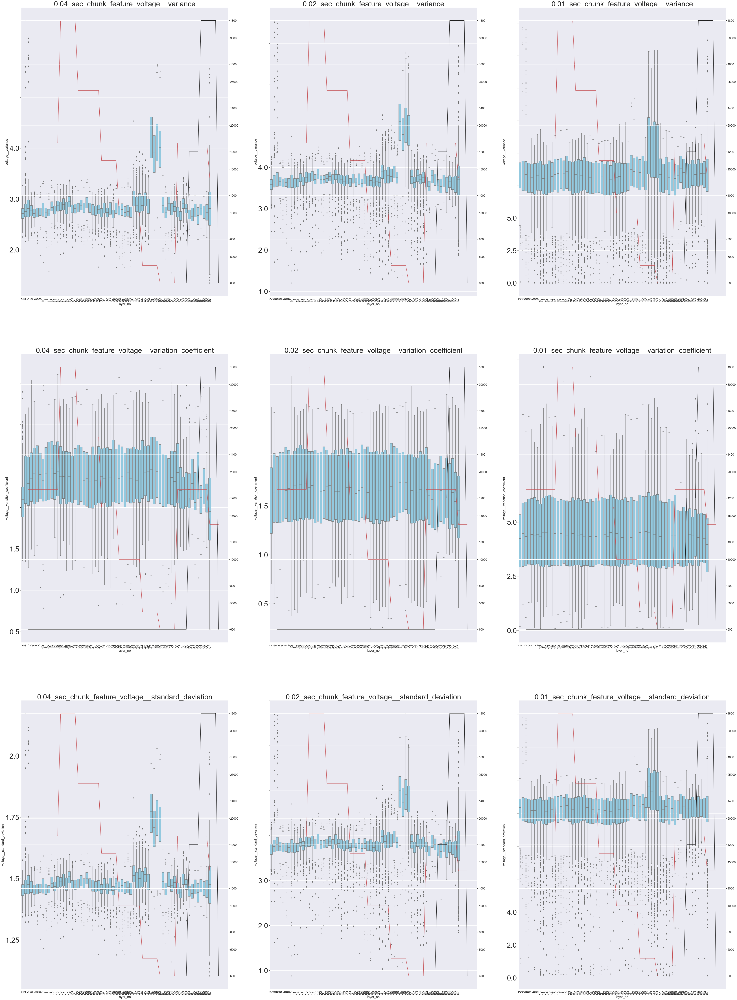

In [239]:
## 1. Update param list 2. Update path for 1 sec file 3. Check plot looks


#list_param1= ['voltage__abs_energy', 'voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',   'voltage__fourier_entropy__bins_3', 'voltage__fourier_entropy__bins_5', 'voltage__fourier_entropy__bins_10',   'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98', 'voltage__matrix_profile__feature_"median"__threshold_0.98',   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1', 'voltage__time_reversal_asymmetry_statistic__lag_2',  'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']
list_param1= ['voltage__c3__lag_1','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7','voltage__matrix_profile__feature_"min"__threshold_0.98' ,   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__variation_coefficient', 'voltage__standard_deviation']
print(len(list_param1))
data1 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.04.xlsx')
data2 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.02.xlsx')
data3 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.01.xlsx')
list_time = [0.04, 0.02 , 0.01]
list_data = [data1, data2, data3 ]

x = 17
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

21


C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1247356572.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1247356572.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1247356572.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1247356572.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\1247356572.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

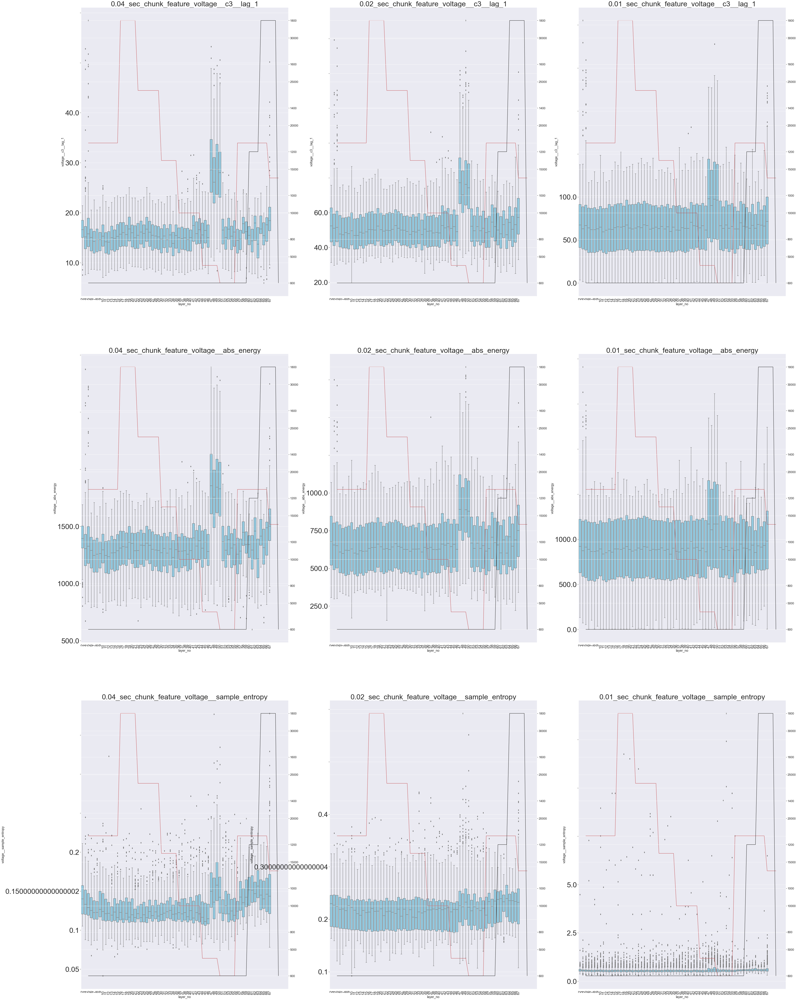

In [206]:
## 1. Update param list 2. Update path for 1 sec file 3. Check plot looks


#list_param1= ['voltage__abs_energy', 'voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',   'voltage__fourier_entropy__bins_3', 'voltage__fourier_entropy__bins_5', 'voltage__fourier_entropy__bins_10',   'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98', 'voltage__matrix_profile__feature_"median"__threshold_0.98',   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1', 'voltage__time_reversal_asymmetry_statistic__lag_2',  'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']
list_param1= ['voltage__c3__lag_1','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7','voltage__matrix_profile__feature_"min"__threshold_0.98' ,   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__variation_coefficient', 'voltage__standard_deviation']
print(len(list_param1))
data1 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.04.xlsx')
data2 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.02.xlsx')
data3 = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Steel_wall2_Misc\data_full\data_full_0.01.xlsx')
list_time = [0.04, 0.02 , 0.01]
list_data = [data1, data2, data3 ]

x = -1
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()



    


4.'voltage__abs_energy', 

5. 'voltage__sample_entropy', 

6. 'voltage__approximate_entropy__m_2__r_0.1'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3542055151.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3542055151.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3542055151.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3542055151.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3542055151.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

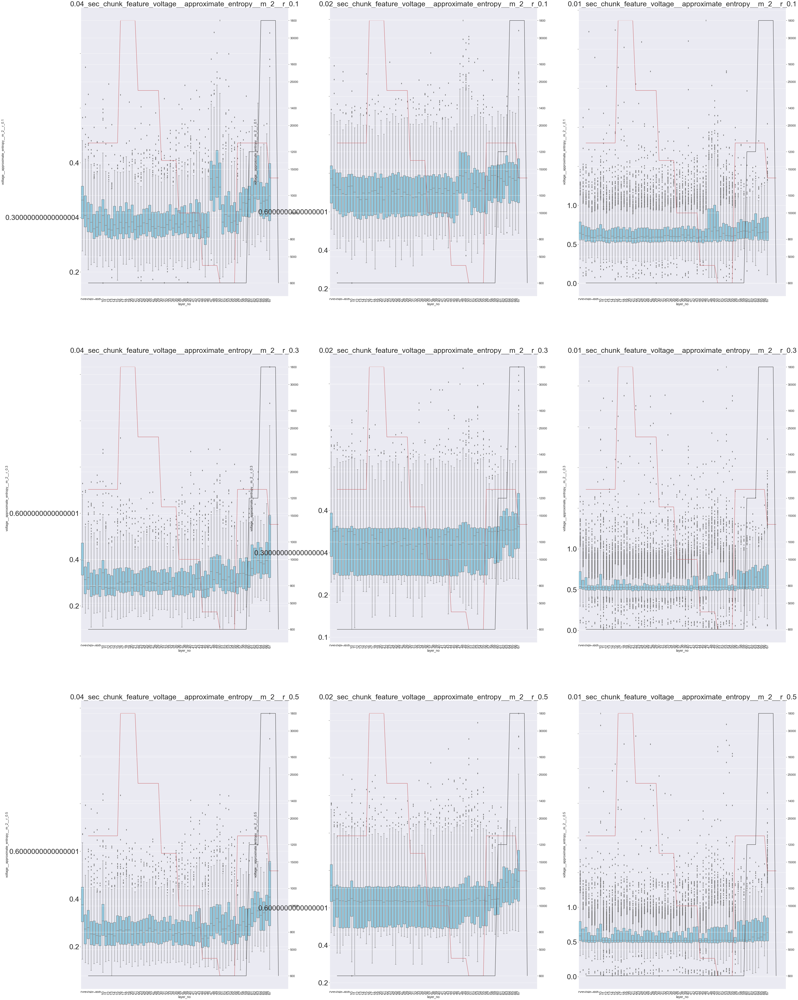

In [207]:
x = 2
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

7. 'voltage__approximate_entropy__m_2__r_0.3', 

8. 'voltage__approximate_entropy__m_2__r_0.5', 

9. 'voltage__approximate_entropy__m_2__r_0.7'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3438838666.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3438838666.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3438838666.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3438838666.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3438838666.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

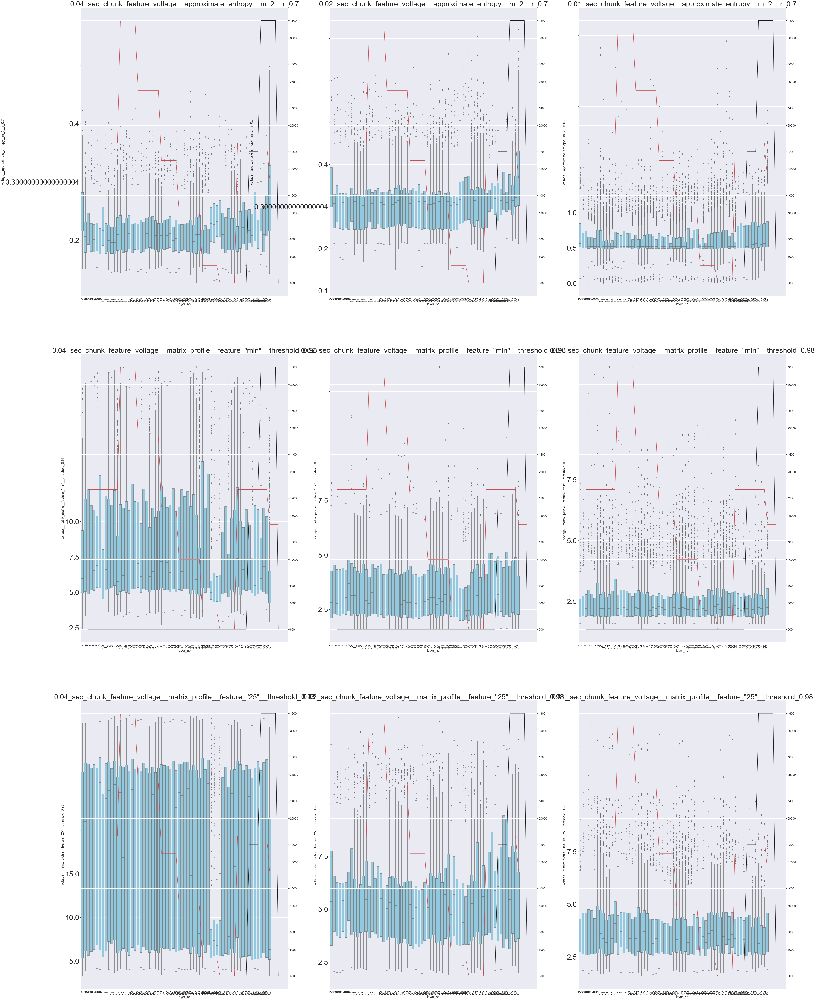

In [208]:
x = 5
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

10 - 'voltage__approximate_entropy__m_2__r_0.9',  *** Only good

11. 'voltage__fourier_entropy__bins_2',   

12. 'voltage__fourier_entropy__bins_3'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\56011762.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\56011762.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\56011762.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\56011762.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\56011762.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_980

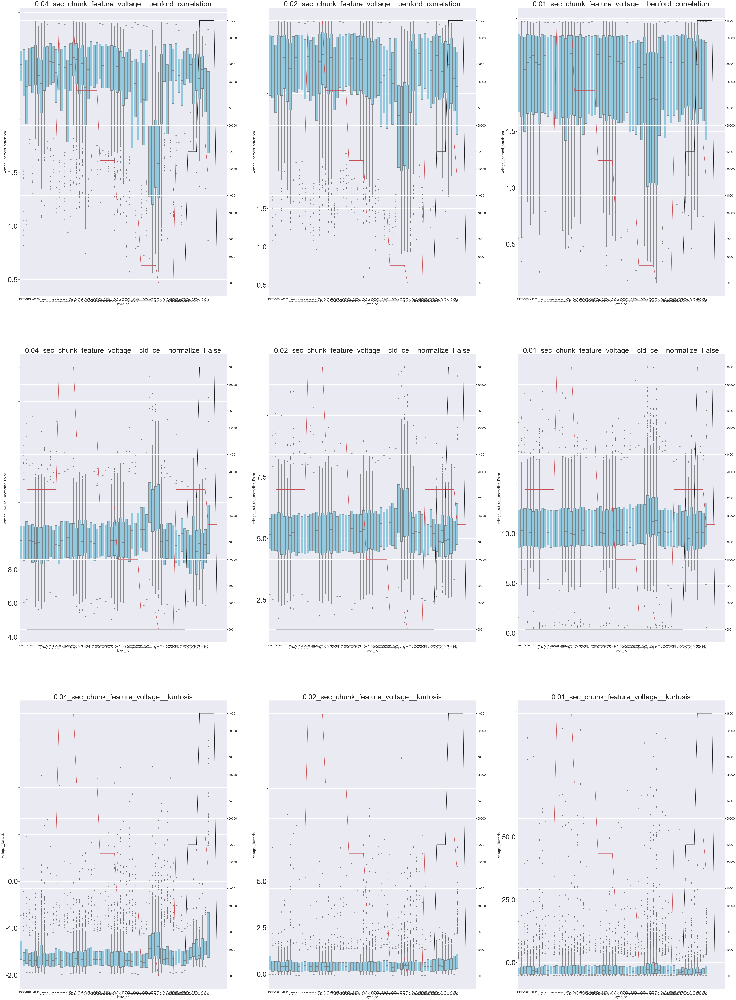

In [209]:

x = 8
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

13. 'voltage__fourier_entropy__bins_5', 

14. 'voltage__fourier_entropy__bins_10',   

15. 'voltage__fourier_entropy__bins_100' *Only good

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3021815104.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3021815104.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3021815104.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3021815104.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\3021815104.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

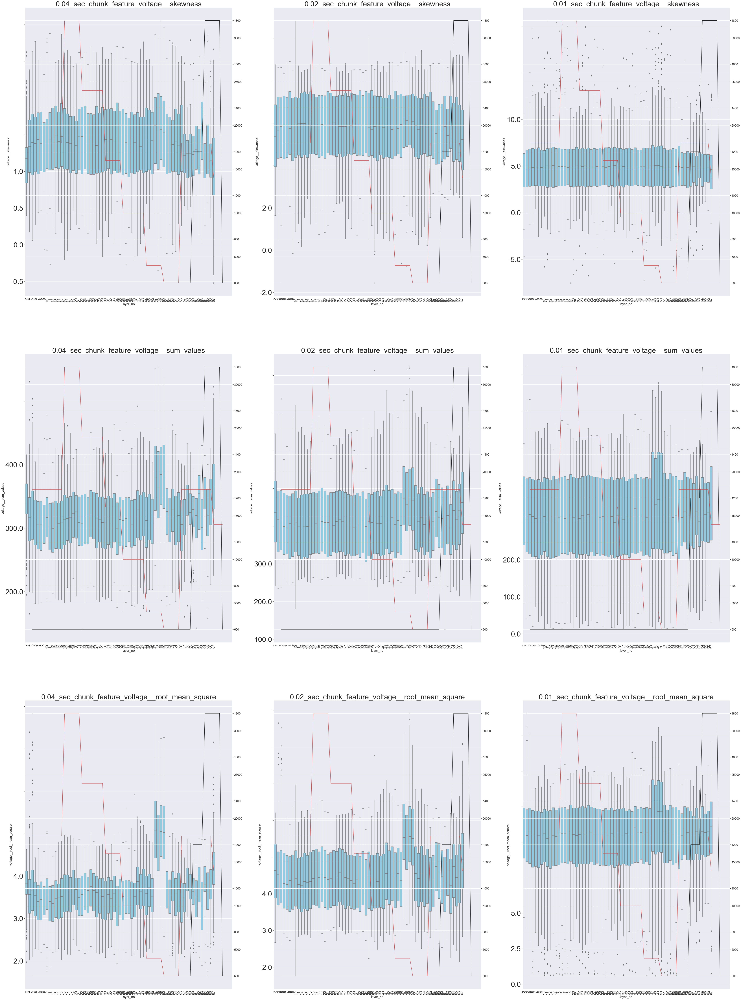

In [210]:

x = 11
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

16: 'voltage__matrix_profile__feature_"min"__threshold_0.98',

17: 'voltage__matrix_profile__feature_"max"__threshold_0.98',

18. 'voltage__matrix_profile__feature_"mean"__threshold_0.98'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\364945381.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\364945381.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\364945381.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\364945381.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\364945381.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykerne

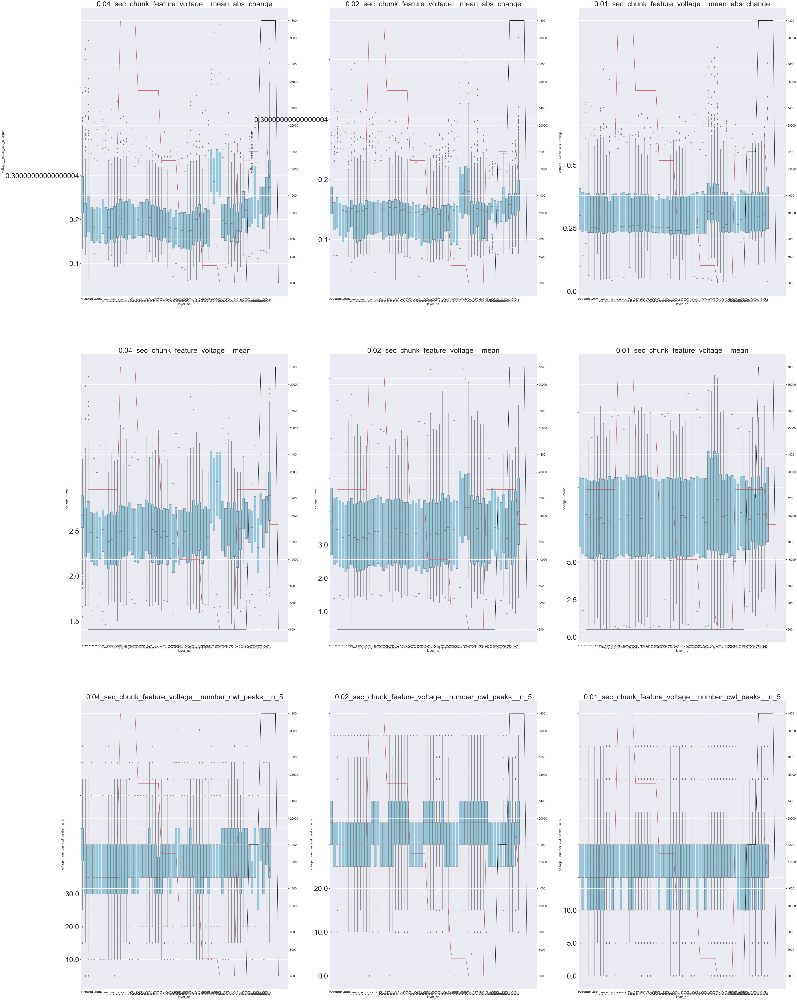

In [211]:

x = 14
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

19. 'voltage__matrix_profile__feature_"median"__threshold_0.98',  

20. 'voltage__matrix_profile__feature_"25"__threshold_0.98', 
 
21.  'voltage__matrix_profile__feature_"75"__threshold_0.98'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\323646224.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\323646224.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\323646224.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\323646224.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_9800\323646224.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykerne

IndexError: list index out of range

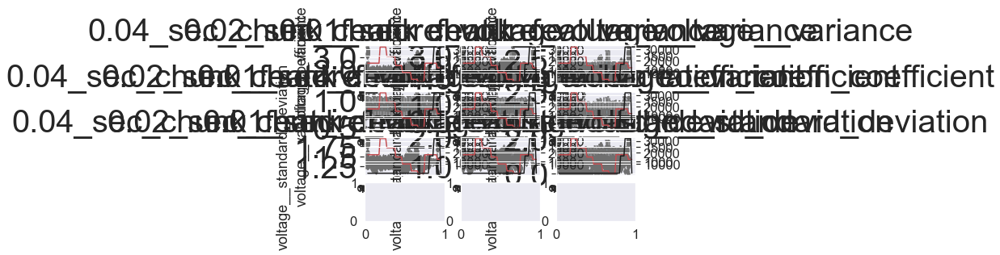

In [212]:

x = 17
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)
        b.set_yticklabels(b.get_yticks(), size = 40)
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        p2 =  twin1.plot(data_to_use['layer_no'],data_to_use['gas_flow'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_to_use['layer_no'],data_to_use['welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(120)
plt.show()

22. 'voltage__fourier_entropy__bins_2', * Not good
23. 'voltage__benford_correlation', 
24. 'voltage__cid_ce__normalize_False'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\762703354.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\762703354.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\762703354.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\762703354.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\762703354.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipy

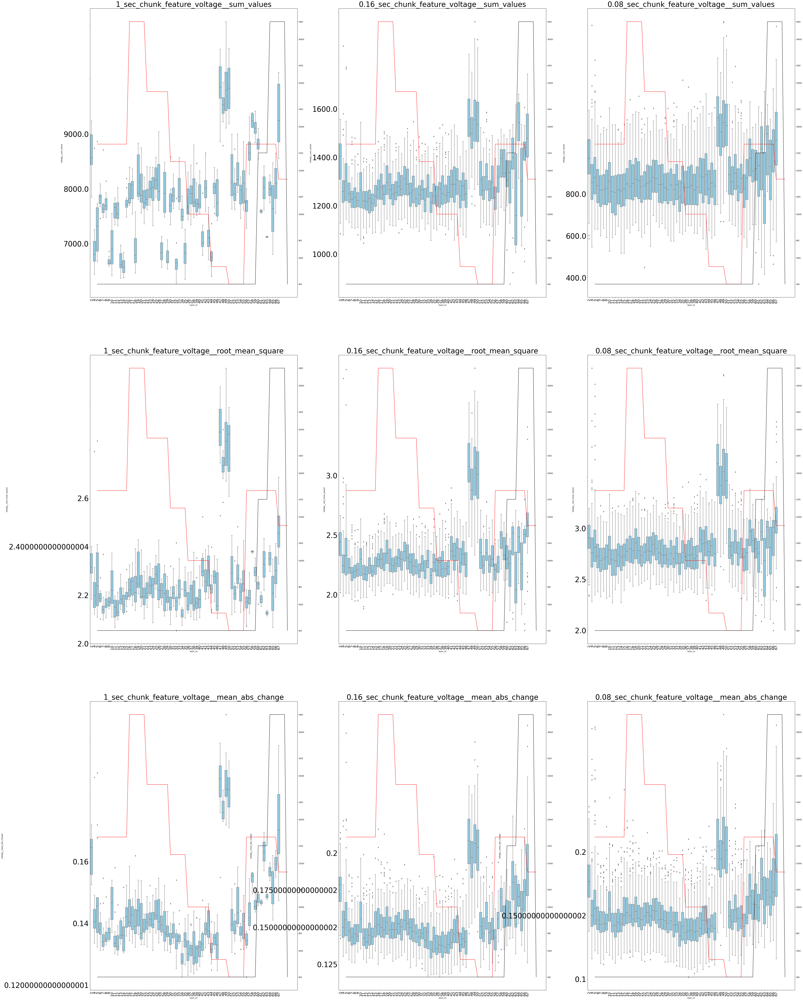

In [315]:
x = 20
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        #sns.set(font_scale = 2)
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)

        b.set_yticklabels(b.get_yticks(), size = 40)
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()

        #sns.lineplot(data = data_log1,x =  'track number (acoustic)' ,y = 'Gasflow parameter', color = 'r', ax = twin1)
        #sns.lineplot(data = data_log1,x = 'track number (acoustic)' ,  y = 'Welding speed', color = 'k', ax = twin2)
        p2 =  twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

25. 'voltage__kurtosis', 

26. 'voltage__skewness',

27. 'voltage__sum_values' (more varaince for high speed)

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3788860145.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3788860145.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3788860145.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3788860145.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3788860145.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Tem

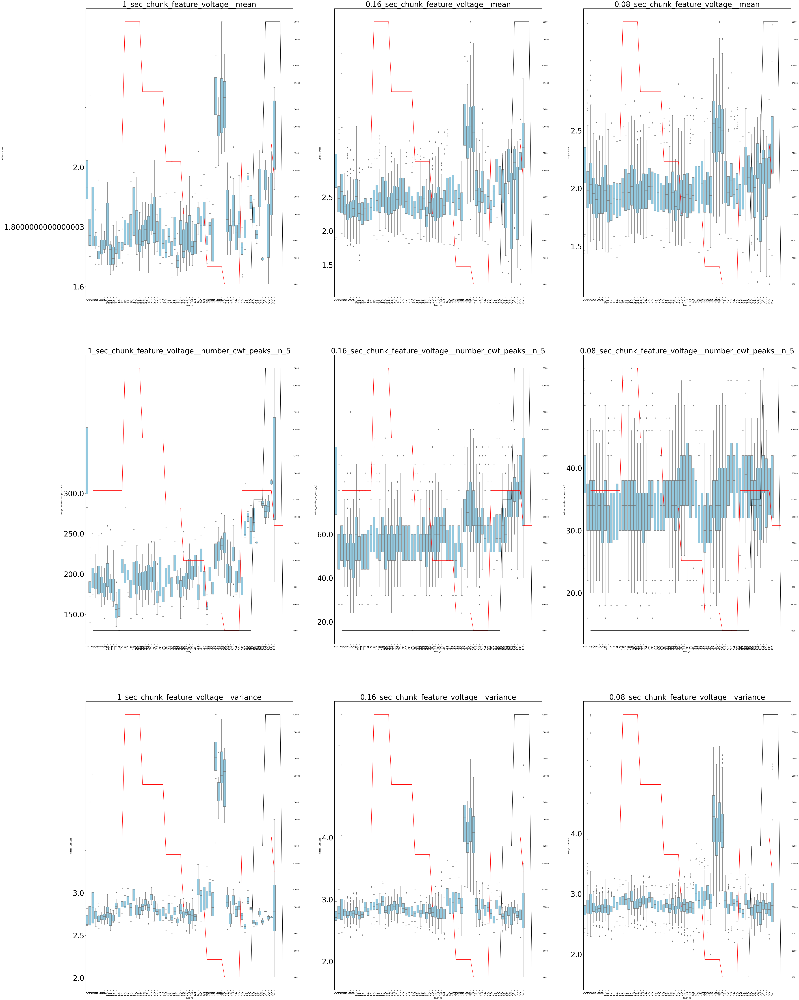

In [316]:
x = 23
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        #sns.set(font_scale = 2)
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)

        b.set_yticklabels(b.get_yticks(), size = 40)
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()

        #sns.lineplot(data = data_log1,x =  'track number (acoustic)' ,y = 'Gasflow parameter', color = 'r', ax = twin1)
        #sns.lineplot(data = data_log1,x = 'track number (acoustic)' ,  y = 'Welding speed', color = 'k', ax = twin2)
        p2 =  twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

28. 'voltage__root_mean_square', [SQAURE ROOT OF SQ: OF ABS: VALUE]

29. 'voltage__mean_abs_change', [Returns the mean over the absolute differences between subsequent time series values which is]

30 .'voltage__mean'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\1423570787.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\1423570787.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\1423570787.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\1423570787.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\1423570787.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Tem

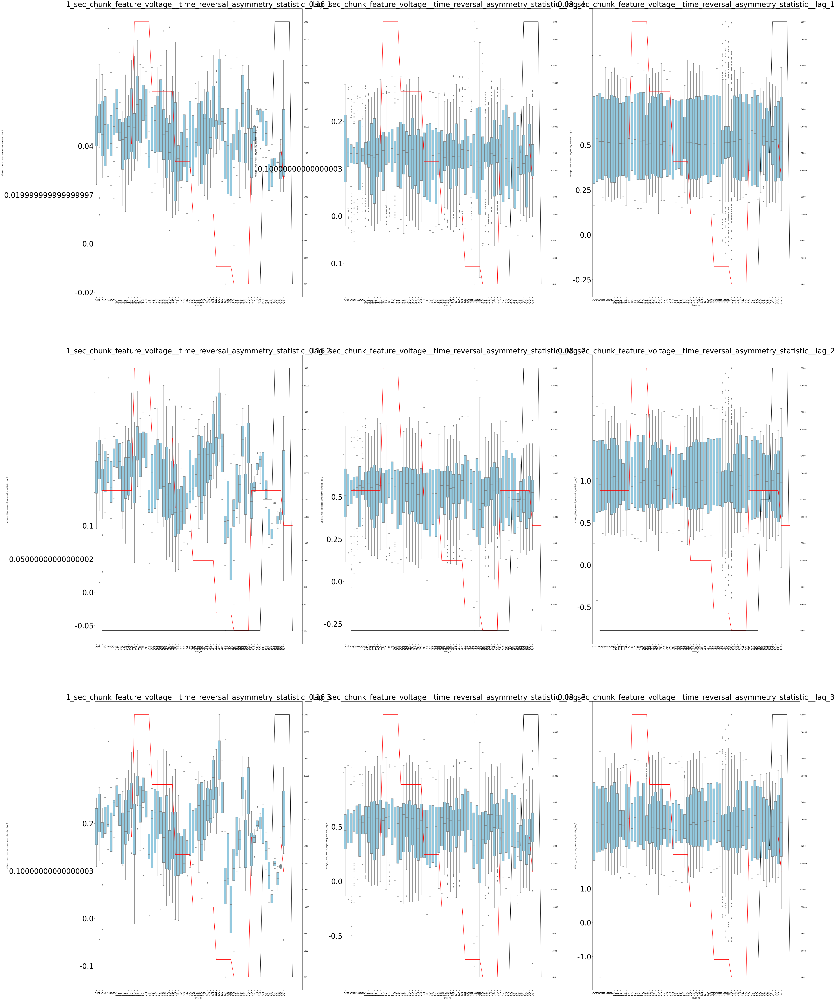

In [317]:
x = 26
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        #sns.set(font_scale = 2)
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)

        b.set_yticklabels(b.get_yticks(), size = 40)
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()

        #sns.lineplot(data = data_log1,x =  'track number (acoustic)' ,y = 'Gasflow parameter', color = 'r', ax = twin1)
        #sns.lineplot(data = data_log1,x = 'track number (acoustic)' ,  y = 'Welding speed', color = 'k', ax = twin2)
        p2 =  twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)

fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

31. 'voltage__number_cwt_peaks__n_5', [Number of different peaks in x.]

32. 'voltage__variance', 

33. 'voltage__symmetry_looking__r_0.05'

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3572248362.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3572248362.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3572248362.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3572248362.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_12188\3572248362.py:15: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 40)
C:\Users\z004ffpk\AppData\Local\Tem

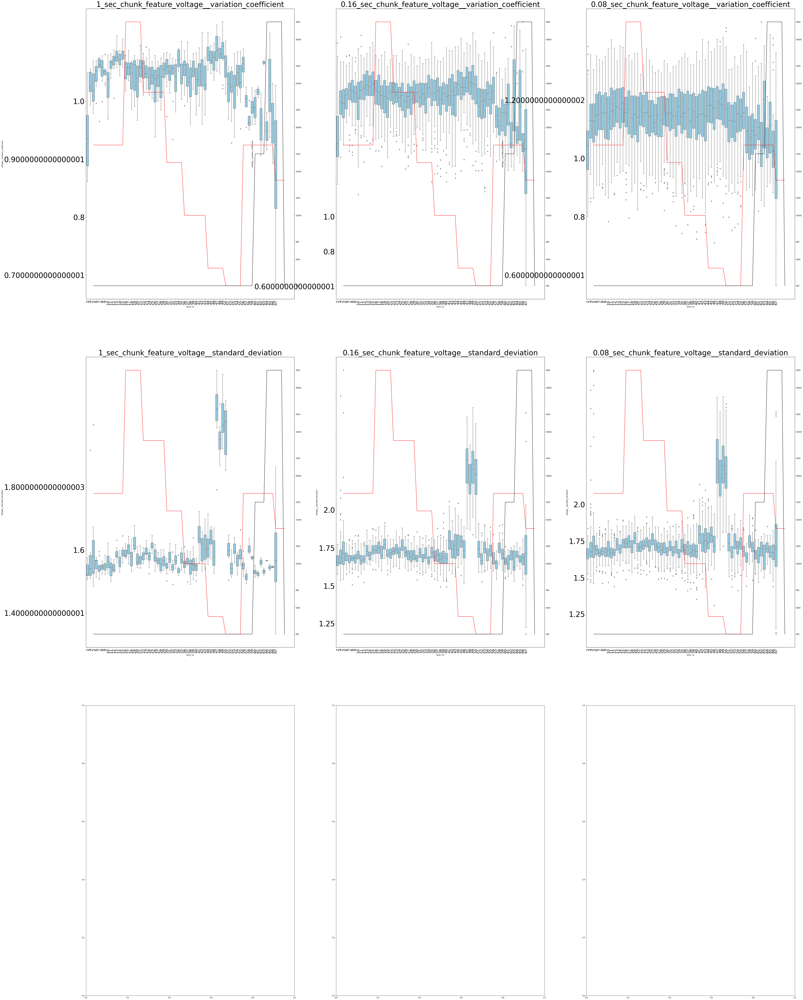

In [318]:
x = 29
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    if x == 32:
        break
    for j in range(3):
        data_to_use = list_data[j]
        #sns.set(font_scale = 2)
        b = sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        y_label = [ 2, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 
        58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
        b.set_xticklabels(y_label, size = 20, rotation = 90)

        b.set_yticklabels(b.get_yticks(), size = 40)
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()

        #sns.lineplot(data = data_log1,x =  'track number (acoustic)' ,y = 'Gasflow parameter', color = 'r', ax = twin1)
        #sns.lineplot(data = data_log1,x = 'track number (acoustic)' ,  y = 'Welding speed', color = 'k', ax = twin2)
        p2 =  twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        p3 =  twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        axes[i,j].set_title('{}_sec_chunk_feature_{}'.format(list_time[j], list_param1[x] ), fontsize=40)


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

34. 'voltage__time_reversal_asymmetry_statistic__lag_1', [Returns the time reversal asymmetry statistic.]

35. 'voltage__time_reversal_asymmetry_statistic__lag_2', 

36. 'voltage__time_reversal_asymmetry_statistic__lag_3', 

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_5600\3820874507.py:39: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout(pad=20.0)


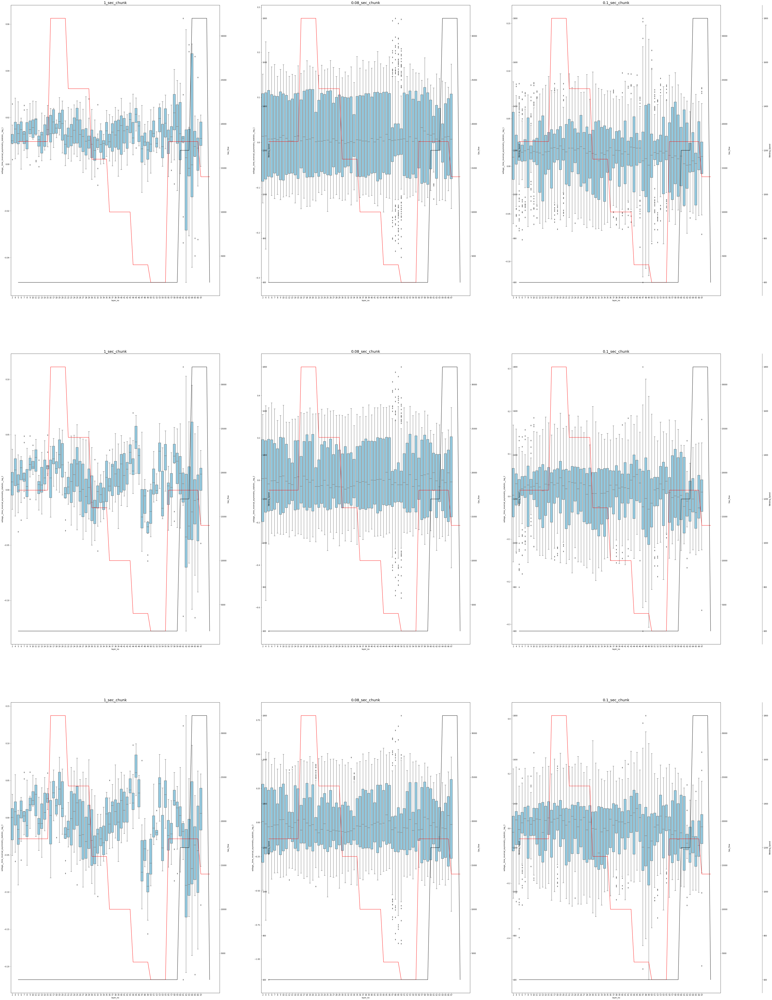

In [252]:

x = 32
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    for j in range(3):
        data_to_use = list_data[j]
        sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        twin2.spines.right.set_position(("axes", 1.2))
        twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        twin1.set_ylabel('Gas_flow')
        twin2.set_ylabel("Welding_Speed")
        axes[i,j].set_title('{}_sec_chunk'.format(list_time[j]), fontsize=20)


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

37. 'voltage__variation_coefficient', [RELATIONSHIP WITH SPEED]

38. 'voltage__standard_deviation' [good relationship with gas flow]

C:\Users\z004ffpk\AppData\Local\Temp\ipykernel_5600\659336218.py:41: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.tight_layout(pad=20.0)


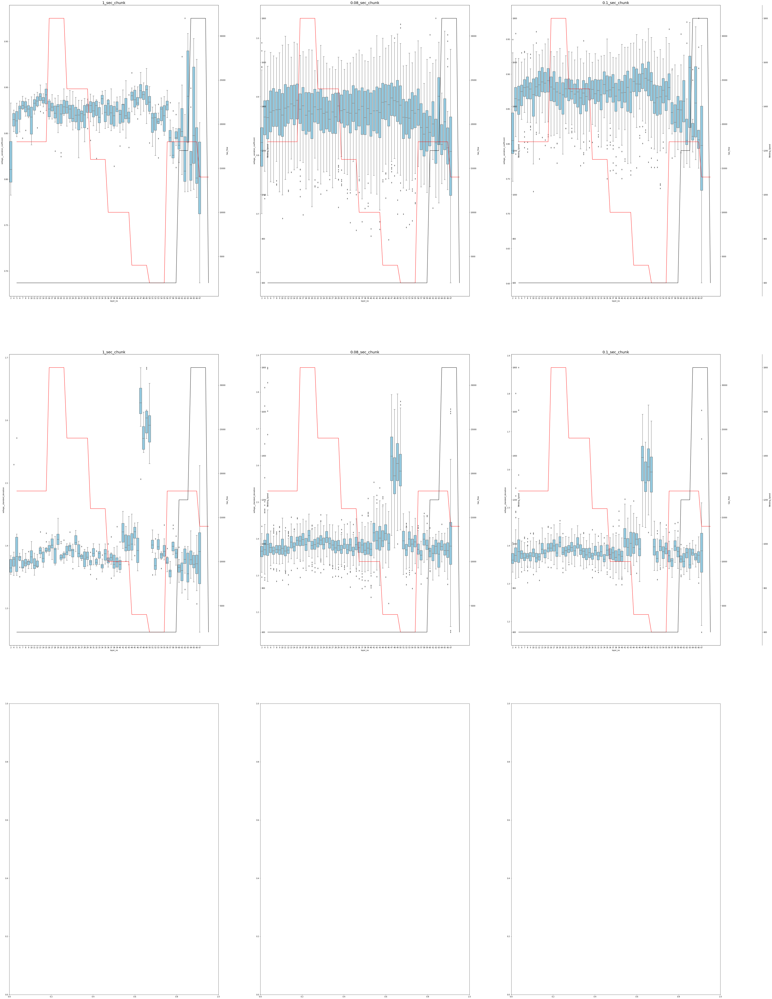

In [253]:
x = 35
fig, axes = plt.subplots(3,3)
for i in range(3):
    x = x + 1
    if x == 38:
        break
    for j in range(3):
        data_to_use = list_data[j]
        sns.boxplot(ax=axes[i, j], data=data_to_use, x='layer_no', y= list_param1[x], color="skyblue")
        #axes[i, j].boxplot(x=data_to_use['layer_no'], y= data_to_use[list_param1[x]])
        twin1 = axes[i, j].twinx()
        twin2 = axes[i, j].twinx()
        twin2.spines.right.set_position(("axes", 1.2))
        twin1.plot(data_log1['track number (acoustic)'],data_log1['Gasflow parameter'], "r-", label='Gas_flow')
        twin2.plot(data_log1['track number (acoustic)'],data_log1['Welding speed'], "k-", label='Welding_Speed' )
        twin1.set_ylabel('Gas_flow')
        twin2.set_ylabel("Welding_Speed")
        axes[i,j].set_title('{}_sec_chunk'.format(list_time[j]), fontsize=20)


    
fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

Feature plotting per layer with different chunk size : ~ 1 sec., 0.08sec, 0.1 sec

Work done-

1. Script to divide the layer for given time chunk 
2. Tsfresh features for all chunk 
3. Plotting curves
4. Research for feature selection -----> most require labelling, regression model, correlation, dimensionality reduction
5. Sensitivity to chunk

In [ ]:
#####---------------------------------------IMPORTANT TSFRESH PARAMETER---------------------------------######

list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',   'voltage__fourier_entropy__bins_3', 'voltage__fourier_entropy__bins_5', 'voltage__fourier_entropy__bins_10',   'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98', 'voltage__matrix_profile__feature_"median"__threshold_0.98',   'voltage__matrix_profile__feature_"25"__threshold_0.98', 'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1', 'voltage__time_reversal_asymmetry_statistic__lag_2',  'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']



path_direc = 'Features_steelwall2_all'


box_plot_final_data = {}

i= 1
for files in os.listdir(path_direc):
#    print(files)
#    os.chdir(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Features_steelwall2_all')
#    pd.read_excel(files)
#    extracted_features = extract_features( pd.read_excel(files),column_id="id", column_sort="time", column_kind="kind", column_value="value")
#    extracted_features.to_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Tsfreshfeatures\features{}.xlsx'.format(i))
   list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']
   for elem in list_param1:
      if i==1:
         box_plot_final_data[elem] = {'{}'.format(i): pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Tsfreshfeatures\features{}.xlsx'.format(i))[elem].tolist()}
      else:
         box_plot_final_data[elem]['{}'.format(i)] = pd.read_excel(r'C:\Users\z004ffpk\Desktop\Thesis\Code_Visualization\Tsfreshfeatures\features{}.xlsx'.format(i))[elem].tolist()
   i = i + 1

#print(box_plot_final_data['voltage__c3__lag_1'])
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']
#print(len(list_param1))
#print(box_plot_final_data['voltage__c3__lag_1'])
#a_file = open("Features_steelwall2_all\sample.csv", "w")
                                                                                                                                                                                                                        
x = 0

fig, axs = plt.subplots(5,2)
for i in range(5):
   for j in range(2):
     
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90)
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1

#sns.boxplot(x =box_plot_final_data[list_param1[x]].keys(), y=box_plot_final_data[list_param1[x]].values() )



# ax[0, 0].plot(y, 'tab:orange')
# ax[0, 0].plot(y_cur, 'tab:blue')
# ax[0, 1].plot(y2, 'tab:orange')
# ax[0, 1].plot(y2_cur, 'tab:blue')
# ax[0, 2].plot(y3, 'tab:orange')
# ax[0, 2].plot(y3_cur, 'tab:blue')


# axs[1, 0].plot(y4, 'tab:orange')
# axs[1, 0].set_title('ANOMOLIC DATA', fontsize=10)
# axs[1, 0].plot(y4_cur, 'tab:blue')
# axs[1, 1].plot(y5, 'tab:orange')
# axs[1, 1].plot(y5_cur, 'tab:blue')
# axs[1, 1].set_title('ANOMOLIC DATA', fontsize=10)
# axs[1, 2].plot(y6, 'tab:orange')
# axs[1, 2].plot(y6_cur, 'tab:blue')
# axs[1, 2].set_title('ANOMOLIC DATA', fontsize=10)



fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()





In [ ]:


#print(box_plot_final_data['voltage__c3__lag_1'])
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']
#print(len(list_param1))
#print(box_plot_final_data['voltage__c3__lag_1'])
#a_file = open("Features_steelwall2_all\sample.csv", "w")
print(box_plot_final_data[list_param1[10]])
x = 10

fig, axs = plt.subplots(5,2)
for i in range(5):
   for j in range(2):
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90)
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1

#sns.boxplot(x =box_plot_final_data[list_param1[x]].keys(), y=box_plot_final_data[list_param1[x]].values() )



# ax[0, 0].plot(y, 'tab:orange')
# ax[0, 0].plot(y_cur, 'tab:blue')
# ax[0, 1].plot(y2, 'tab:orange')
# ax[0, 1].plot(y2_cur, 'tab:blue')
# ax[0, 2].plot(y3, 'tab:orange')
# ax[0, 2].plot(y3_cur, 'tab:blue')


# axs[1, 0].plot(y4, 'tab:orange')
# axs[1, 0].set_title('ANOMOLIC DATA', fontsize=10)
# axs[1, 0].plot(y4_cur, 'tab:blue')
# axs[1, 1].plot(y5, 'tab:orange')
# axs[1, 1].plot(y5_cur, 'tab:blue')
# axs[1, 1].set_title('ANOMOLIC DATA', fontsize=10)
# axs[1, 2].plot(y6, 'tab:orange')
# axs[1, 2].plot(y6_cur, 'tab:blue')
# axs[1, 2].set_title('ANOMOLIC DATA', fontsize=10)



fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()


# dict_from_csv = pd.read_csv("Features_steelwall2_all\sample.csv").to_dict()
# print(dict_from_csv['voltage__c3__lag_1'])


In [ ]:
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']


x = 20

fig, axs = plt.subplots(5,2)
for i in range(5):
   for j in range(2):
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90)
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

In [ ]:
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']



x = 30

fig, axs = plt.subplots(5,2)
for i in range(5):
   for j in range(2):
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90)
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

In [ ]:
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']


x = 40

fig, axs = plt.subplots(5,2)
for i in range(5):
   for j in range(2):
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90 )
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

In [ ]:
list_param1= ['voltage__c3__lag_1', 'voltage__c3__lag_2','voltage__c3__lag_3','voltage__abs_energy', 'voltage__sample_entropy', 'voltage__approximate_entropy__m_2__r_0.1', 'voltage__approximate_entropy__m_2__r_0.3', 'voltage__approximate_entropy__m_2__r_0.5', 'voltage__approximate_entropy__m_2__r_0.7', 'voltage__approximate_entropy__m_2__r_0.9',  'voltage__fourier_entropy__bins_2',	'voltage__fourier_entropy__bins_3',	'voltage__fourier_entropy__bins_5',	'voltage__fourier_entropy__bins_10',	'voltage__fourier_entropy__bins_100','voltage__matrix_profile__feature_"min"__threshold_0.98','voltage__matrix_profile__feature_"max"__threshold_0.98','voltage__matrix_profile__feature_"mean"__threshold_0.98',	'voltage__matrix_profile__feature_"median"__threshold_0.98',	'voltage__matrix_profile__feature_"25"__threshold_0.98',	'voltage__matrix_profile__feature_"75"__threshold_0.98', 'voltage__fourier_entropy__bins_2', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"var"','voltage__abs_energy', 'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"stderr"__chunk_len_5__f_agg_"min"' , 'voltage__agg_linear_trend__attr_"slope"__chunk_len_10__f_agg_"mean"', 'voltage__agg_linear_trend__attr_"slope"__chunk_len_50__f_agg_"max"','voltage__linear_trend__attr_"intercept"', 'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_5__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_10__f_agg_"var"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"max"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"min"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"mean"',	'voltage__agg_linear_trend__attr_"intercept"__chunk_len_50__f_agg_"var"', 'voltage__benford_correlation', 'voltage__cid_ce__normalize_False','voltage__kurtosis', 'voltage__skewness','voltage__sum_values', 'voltage__root_mean_square', 'voltage__abs_energy', 'voltage__mean_abs_change', 'voltage__mean' , 'voltage__number_cwt_peaks__n_5','voltage__variance', 'voltage__symmetry_looking__r_0.05', 'voltage__time_reversal_asymmetry_statistic__lag_1',	'voltage__time_reversal_asymmetry_statistic__lag_2',	'voltage__time_reversal_asymmetry_statistic__lag_3', 'voltage__variation_coefficient', 'voltage__standard_deviation']


x = 50

fig, axs = plt.subplots(5,2)
for i in range(5):
   if x==58:
      data_gas_flow1 = data_gas_flow.dropna(subset=['track number (acoustic)'])
      axs[4,0].plot(data_gas_flow1['track number (acoustic)'], data_gas_flow1['Gasflow parameter'])
      axs[4,0].set_xticklabels(box_plot_final_data[list_param1[57]].keys(), fontsize = 15, rotation= 90 )
      axs[4,0].set_xlabel('Layer_No.', fontsize=20)
      axs[4,0].set_ylabel('Gas flow', fontsize=20)
      break
   for j in range(2):
      list3 = []
      for keys, values in box_plot_final_data[list_param1[x]].items():
            list3.append(values)

      flat_list = [item for sublist in list3 for item in sublist]
      #print(flat_list)
      max2 = max(flat_list)
      min2 = min(flat_list)
      f1 = np.linspace(min2,max2, 10).tolist()
      axs[i,j].boxplot(box_plot_final_data[list_param1[x]].values())
      axs[i,j].set_xticklabels(box_plot_final_data[list_param1[x]].keys(), fontsize = 15, rotation= 90 )
      axs[i,j].set_yticklabels(f1, fontsize = 20 )
      #axs[i,j].set_title(list_param1[x], fontsize=50)
      # axs[i,j].xlabel('Layer_No.', fontsize=0)
      axs[i,j].set_xlabel('Layer_No.', fontsize=20)
      axs[i,j].set_ylabel(list_param1[x], fontsize=20)
      x = x + 1


fig.tight_layout(pad=20.0)
fig.set_figwidth(70)
fig.set_figheight(100)
plt.show()

In [ ]:
# extracted_features = extract_features(new_dataframe,column_id="id", column_sort="time", column_kind="kind", column_value="value")
# extracted_features.to_excel('all_layers2_4007timestamp.xlsx')

In [ ]:
pf.head()

In [ ]:
## Features
count1 = pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].count()  
count2 = pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].count()
count3 = pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].count()
count4 = pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].count()
count5 = pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].count()


data_new1 = {'id': key_layers[0],'time':list(range(count1)),  'kind':  'voltage', 'value': pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna() }

data_new2 = {'id': key_layers[1],'time':list(range(count2)),  'kind':  'voltage', 'value': pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna() }

data_new3 = {'id': key_layers[2],'time':list(range(count3)),  'kind':  'voltage', 'value': pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna() }

data_new4 = {'id': key_layers[3],'time':list(range(count4)),  'kind':  'voltage', 'value': pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna() }

data_new5 = {'id': key_layers[4],'time':list(range(count5)),  'kind':  'voltage', 'value': pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna() }

df_new1 = pd.DataFrame(data_new1)
df_new2 = pd.DataFrame(data_new2)
df_new3 = pd.DataFrame(data_new3)
df_new4 = pd.DataFrame(data_new4)
df_new5 = pd.DataFrame(data_new5)

new_dataframe = pd.concat([df_new1, df_new2, df_new3, df_new4, df_new5])

# new_dataframe.set_index('id')
# new_dataframe.head()
# extracted_features = extract_features(new_dataframe,column_id="id", column_sort="time", column_kind="kind", column_value="value")
# extracted_features.to_excel('all_layers2_4007timestamp.xlsx')
# y = np.array([[6, 0], [16, 0], [17, 0], [49, 1], [54, 0]]).astype(int)



# impute(extracted_features)
# features_filtered = select_features(extracted_features, y)
# extracted_features.to_excel('all_layers2_selected_features.xlsx')

In [ ]:
# count1 = pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].count()  
# count2 = pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].count()
# count3 = pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].count()
# count4 = pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].count()
# count5 = pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].count()

y = fft(pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y2 = fft(pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y2 =  pf.iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y3 = fft(pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y3 = pf.iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y4 = fft(pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y4 = pf.iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y5 = fft(pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y5 = pf.iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']

fig, axs = plt.subplots(3, 2)
axs[0, 0].plot(time_y, y)
axs[0, 1].plot(time_y2, y2, 'tab:orange')
axs[1, 0].plot(time_y3, y3)
axs[1, 1].plot(time_y4, y4, 'tab:red')
axs[1, 1].set_title('ANOMOLIC', fontsize=20)
axs[2, 0].plot(time_y5, y5, 'tab:purple')

fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
###FFT




# count1 = pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].count()  
# count2 = pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].count()
# count3 = pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].count()
# count4 = pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].count()
# count5 = pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].count()

y = fft(pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y2 = fft(pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y2 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y3 = fft(pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y3 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y4 = fft(pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y4 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y5 = fft(pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna().to_numpy())
time_y5 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']

fig, axs = plt.subplots(3, 2)
axs[0, 0].plot(time_y, y)
axs[0, 1].plot(time_y2, y2, 'tab:orange')
axs[1, 0].plot(time_y3, y3)
axs[1, 1].plot(time_y4, y4, 'tab:red')
axs[1, 1].set_title('ANOMOLIC', fontsize=20)
axs[2, 0].plot(time_y5, y5, 'tab:purple')

fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()


In [ ]:


# count1 = pf['voltage'].iloc[portion(6,2, 400, False, 4 )[0]:portion(6,2, 400, False, 4 )[1]].count()  
# count2 = pf['voltage'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]].count()
# count3 = pf['voltage'].iloc[portion(17,2, 400, False, 4 )[0]:portion(17,2, 400, False, 4 )[1]].count()
# count4 = pf['voltage'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]].count()
# count5 = pf['voltage'].iloc[portion(54,2, 400, False, 4 )[0]:portion(54,2, 400, False, 4 )[1]].count()

y = fft(pf['voltage'].iloc[portion(6,2, 400, False, 4 )[0]:portion(6,2, 400, False, 4 )[1]].dropna().to_numpy())
time_y = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y2 = fft(pf['voltage'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]].dropna().to_numpy())
time_y2 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y3 = fft(pf['voltage'].iloc[portion(17,2, 400, False, 4 )[0]:portion(17,2, 400, False, 4 )[1]].dropna().to_numpy())
time_y3 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y4 = fft(pf['voltage'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]].dropna().to_numpy())
time_y4 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y5 = fft(pf['voltage'].iloc[portion(54,2, 400, False, 4 )[0]:portion(54,2, 400, False, 4 )[1]].dropna().to_numpy())
time_y5 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']

fig, axs = plt.subplots(3, 2)
axs[0, 0].plot(time_y, y)
axs[0, 1].plot(time_y2, y2, 'tab:orange')
axs[1, 0].plot(time_y3, y3)
axs[1, 1].plot(time_y4, y4, 'tab:red')
axs[1, 1].set_title('ANOMOLIC', fontsize=20)
axs[2, 0].plot(time_y5, y5, 'tab:purple')

fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
#fft

# count1 = pf['voltage'].iloc[portion(6,3, 400, False, 4 )[0]:portion(6,3, 400, False, 4 )[1]].count()  
# count2 = pf['voltage'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]].count()
# count3 = pf['voltage'].iloc[portion(17,3, 400, False, 4 )[0]:portion(17,3, 400, False, 4 )[1]].count()
# count4 = pf['voltage'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]].count()
# count5 = pf['voltage'].iloc[portion(54,3, 400, False, 4 )[0]:portion(54,3, 400, False, 4 )[1]].count()

y = fft(pf['voltage'].iloc[portion(6,3, 400, False, 4 )[0]:portion(6,3, 400, False, 4 )[1]].dropna().to_numpy())
time_y = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y2 = fft(pf['voltage'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]].dropna().to_numpy())
time_y2 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y3 = fft(pf['voltage'].iloc[portion(17,3, 400, False, 4 )[0]:portion(17,3, 400, False, 4 )[1]].dropna().to_numpy())
time_y3 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y4 = fft(pf['voltage'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]].dropna().to_numpy())
time_y4 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']
y5 = fft(pf['voltage'].iloc[portion(54,3, 400, False, 4 )[0]:portion(54,3, 400, False, 4 )[1]].dropna().to_numpy())
time_y5 = pf.iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna(subset = ['voltage'])['time']

fig, axs = plt.subplots(3, 2)
axs[0, 0].plot(time_y, y)
axs[0, 1].plot(time_y2, y2, 'tab:orange')
axs[1, 0].plot(time_y3, y3)
axs[1, 1].plot(time_y4, y4, 'tab:red')
axs[1, 1].set_title('ANOMOLIC', fontsize=20)
axs[2, 0].plot(time_y5, y5, 'tab:purple')

fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:


# count1 = pf['voltage'].iloc[portion(6,4, 400, False, 4 )[0]:portion(6,4, 400, False, 4 )[1]].count()  
# count2 = pf['voltage'].iloc[portion(16,4, 400, False, 4 )[0]:portion(16,4, 400, False, 4 )[1]].count()
# count3 = pf['voltage'].iloc[portion(17,4, 400, False, 4 )[0]:portion(17,4, 400, False, 4 )[1]].count()
# count4 = pf['voltage'].iloc[portion(49,4, 400, False, 4 )[0]:portion(49,4, 400, False, 4 )[1]].count()
# count5 = pf['voltage'].iloc[portion(54,4, 400, False, 4 )[0]:portion(54,4, 400, False, 4 )[1]].count()

y = fft(pf['voltage'].iloc[portion(6,4, 400, False, 4 )[0]:portion(6,4, 400, False, 4 )[1]].dropna().to_numpy())
time_y = list(range(count1))
y2 = fft(pf['voltage'].iloc[portion(16,4, 400, False, 4 )[0]:portion(16,4, 400, False, 4 )[1]].dropna().to_numpy())
time_y2 = list(range(count2))
y3 = fft(pf['voltage'].iloc[portion(17,4, 400, False, 4 )[0]:portion(17,4, 400, False, 4 )[1]].dropna().to_numpy())
time_y3 = list(range(count3))
y4 = fft(pf['voltage'].iloc[portion(49,4, 400, False, 4 )[0]:portion(49,4, 400, False, 4 )[1]].dropna().to_numpy())
time_y4 = list(range(count4))
y5 = fft(pf['voltage'].iloc[portion(54,4, 400, False, 4 )[0]:portion(54,4, 400, False, 4 )[1]].dropna().to_numpy())
time_y5 = list(range(count5))

fig, axs = plt.subplots(3, 2)
axs[0, 0].plot(time_y, y)
axs[0, 1].plot(time_y2, y2, 'tab:orange')
axs[1, 0].plot(time_y3, y3)
axs[1, 1].plot(time_y4, y4, 'tab:red')
axs[1, 1].set_title('ANOMOLIC', fontsize=20)
axs[2, 0].plot(time_y5, y5, 'tab:purple')

fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
###Current, voltage



y = pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]]
y2 = pf['voltage'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]]
y3 = pf['voltage'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]]
y4 = pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]]
y5 = pf['voltage'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]]
y6 = pf['voltage'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]]

y_cur = pf['current'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]]
y2_cur = pf['current'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]]
y3_cur = pf['current'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]]
y4_cur = pf['current'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]]
y5_cur = pf['current'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]]
y6_cur = pf['current'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]]


fig, axs = plt.subplots(2, 3)
axs[0, 0].plot(y, 'tab:orange')
axs[0, 0].plot(y_cur, 'tab:blue')
axs[0, 1].plot(y2, 'tab:orange')
axs[0, 1].plot(y2_cur, 'tab:blue')
axs[0, 2].plot(y3, 'tab:orange')
axs[0, 2].plot(y3_cur, 'tab:blue')


axs[1, 0].plot(y4, 'tab:orange')
axs[1, 0].set_title('ANOMOLIC DATA', fontsize=10)
axs[1, 0].plot(y4_cur, 'tab:blue')
axs[1, 1].plot(y5, 'tab:orange')
axs[1, 1].plot(y5_cur, 'tab:blue')
axs[1, 1].set_title('ANOMOLIC DATA', fontsize=10)
axs[1, 2].plot(y6, 'tab:orange')
axs[1, 2].plot(y6_cur, 'tab:blue')
axs[1, 2].set_title('ANOMOLIC DATA', fontsize=10)



fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
import seaborn as sns

sns.boxplot( x=new_dataframe["id"], y=new_dataframe["value"], width=1)
plt.show()


In [ ]:
###Wavelet



widths = np.arange(1, 31)
fig = plt.figure()

rows = 3
columns = 2


fig.add_subplot(rows, columns, 1)
cwtmatr1, freqs1 = pywt.cwt(pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr1, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr1).max(), vmin=-abs(cwtmatr1).max())

fig.add_subplot(rows, columns, 2)
cwtmatr2, freqs2 = pywt.cwt(pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr2, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr2).max(), vmin=-abs(cwtmatr2).max())


fig.add_subplot(rows, columns, 3)
cwtmatr3, freqs3 = pywt.cwt(pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr3, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr3).max(), vmin=-abs(cwtmatr3).max())

a = fig.add_subplot(rows, columns, 4)
a.title.set_text('ANOMOLIC')
cwtmatr4, freqs4 = pywt.cwt(pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr4, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr4).max(), vmin=-abs(cwtmatr4).max())

fig.add_subplot(rows, columns, 5)
cwtmatr5, freqs5 = pywt.cwt(pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr5, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr5).max(), vmin=-abs(cwtmatr5).max())



fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
###Wavelet



widths = np.arange(1, 31)
fig = plt.figure()

rows = 3
columns = 2


fig.add_subplot(rows, columns, 1)
cwtmatr1, freqs1 = pywt.cwt(pf['voltage'].iloc[portion(6,2, 400, False, 4 )[0]:portion(6,2, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr1, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr1).max(), vmin=-abs(cwtmatr1).max())

fig.add_subplot(rows, columns, 2)
cwtmatr2, freqs2 = pywt.cwt(pf['voltage'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr2, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr2).max(), vmin=-abs(cwtmatr2).max())


fig.add_subplot(rows, columns, 3)
cwtmatr3, freqs3 = pywt.cwt(pf['voltage'].iloc[portion(17,2, 400, False, 4 )[0]:portion(17,2, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr3, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr3).max(), vmin=-abs(cwtmatr3).max())

a = fig.add_subplot(rows, columns, 4)
a.title.set_text('ANOMOLIC')
cwtmatr4, freqs4 = pywt.cwt(pf['voltage'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr4, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr4).max(), vmin=-abs(cwtmatr4).max())

fig.add_subplot(rows, columns, 5)
cwtmatr5, freqs5 = pywt.cwt(pf['voltage'].iloc[portion(54,2, 400, False, 4 )[0]:portion(54,2, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr5, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr5).max(), vmin=-abs(cwtmatr5).max())



fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
###Wavelet



widths = np.arange(1, 31)
fig = plt.figure()

rows = 3
columns = 2


fig.add_subplot(rows, columns, 1)
cwtmatr1, freqs1 = pywt.cwt(pf['voltage'].iloc[portion(6,3, 400, False, 4 )[0]:portion(6,3, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr1, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr1).max(), vmin=-abs(cwtmatr1).max())

fig.add_subplot(rows, columns, 2)
cwtmatr2, freqs2 = pywt.cwt(pf['voltage'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr2, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr2).max(), vmin=-abs(cwtmatr2).max())


fig.add_subplot(rows, columns, 3)
cwtmatr3, freqs3 = pywt.cwt(pf['voltage'].iloc[portion(17,3, 400, False, 4 )[0]:portion(17,3, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr3, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr3).max(), vmin=-abs(cwtmatr3).max())

a = fig.add_subplot(rows, columns, 4)
a.title.set_text('ANOMOLIC')
cwtmatr4, freqs4 = pywt.cwt(pf['voltage'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr4, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr4).max(), vmin=-abs(cwtmatr4).max())

fig.add_subplot(rows, columns, 5)
cwtmatr5, freqs5 = pywt.cwt(pf['voltage'].iloc[portion(54,3, 400, False, 4 )[0]:portion(54,3, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr5, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr5).max(), vmin=-abs(cwtmatr5).max())



fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
###Wavelet



widths = np.arange(1, 31)
fig = plt.figure()

rows = 3
columns = 2


fig.add_subplot(rows, columns, 1)
cwtmatr1, freqs1 = pywt.cwt(pf['voltage'].iloc[portion(6,4, 400, False, 4 )[0]:portion(6,4, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr1, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr1).max(), vmin=-abs(cwtmatr1).max())

fig.add_subplot(rows, columns, 2)
cwtmatr2, freqs2 = pywt.cwt(pf['voltage'].iloc[portion(16,4, 400, False, 4 )[0]:portion(16,4, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr2, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr2).max(), vmin=-abs(cwtmatr2).max())


fig.add_subplot(rows, columns, 3)
cwtmatr3, freqs3 = pywt.cwt(pf['voltage'].iloc[portion(17,4, 400, False, 4 )[0]:portion(17,4, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr3, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr3).max(), vmin=-abs(cwtmatr3).max())

a = fig.add_subplot(rows, columns, 4)
a.title.set_text('ANOMOLIC')
cwtmatr4, freqs4 = pywt.cwt(pf['voltage'].iloc[portion(49,4, 400, False, 4 )[0]:portion(49,4, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr4, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr4).max(), vmin=-abs(cwtmatr4).max())

fig.add_subplot(rows, columns, 5)
cwtmatr5, freqs5 = pywt.cwt(pf['voltage'].iloc[portion(54,4, 400, False, 4 )[0]:portion(54,4, 400, False, 4 )[1]].dropna().to_numpy(), widths, 'mexh')
plt.imshow(cwtmatr5, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr5).max(), vmin=-abs(cwtmatr5).max())



fig.tight_layout(pad=30.0)
fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

In [ ]:
### Trend, season





data1 = pf['voltage'].iloc[portion(6,1, 400, False, 4 )[0]:portion(6,1, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data2 = pf['voltage'].iloc[portion(16,1, 400, False, 4 )[0]:portion(16,1, 400, False, 4 )[1]].dropna().reset_index(drop = True)


data3 = pf['voltage'].iloc[portion(17,1, 400, False, 4 )[0]:portion(17,1, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data4 = pf['voltage'].iloc[portion(49,1, 400, False, 4 )[0]:portion(49,1, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data5 = pf['voltage'].iloc[portion(54,1, 400, False, 4 )[0]:portion(54,1, 400, False, 4 )[1]].dropna().reset_index(drop = True)
#seasonal_decompose(df , model='additive').plot()


decomposition1 = sm.tsa.seasonal_decompose(data1, model='additive', period= 32)
decomposition1.plot()



decomposition2 = sm.tsa.seasonal_decompose(data2, model='additive', period= 32)
decomposition2.plot()



decomposition3 = sm.tsa.seasonal_decompose(data3, model='additive', period= 32)
decomposition3.plot()



decomposition4 = sm.tsa.seasonal_decompose(data4, model='additive', period= 32)
decomposition4.plot()


decomposition5 = sm.tsa.seasonal_decompose(data5, model='additive', period= 32)
decomposition5.plot()



plt.show()
 

In [ ]:
### Trend, season




data1 = pf['voltage'].iloc[portion(6,2, 400, False, 4 )[0]:portion(6,2, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data2 = pf['voltage'].iloc[portion(16,2, 400, False, 4 )[0]:portion(16,2, 400, False, 4 )[1]].dropna().reset_index(drop = True)


data3 = pf['voltage'].iloc[portion(17,2, 400, False, 4 )[0]:portion(17,2, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data4 = pf['voltage'].iloc[portion(49,2, 400, False, 4 )[0]:portion(49,2, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data5 = pf['voltage'].iloc[portion(54,2, 400, False, 4 )[0]:portion(54,2, 400, False, 4 )[1]].dropna().reset_index(drop = True)
#seasonal_decompose(df , model='additive').plot()

decomposition1 = sm.tsa.seasonal_decompose(data1, model='additive', period= 32)
decomposition1.plot()



decomposition2 = sm.tsa.seasonal_decompose(data2, model='additive', period= 32)
decomposition2.plot()



decomposition3 = sm.tsa.seasonal_decompose(data3, model='additive', period= 32)
decomposition3.plot()


decomposition4 = sm.tsa.seasonal_decompose(data4, model='additive', period= 32)
decomposition4.plot()

decomposition5 = sm.tsa.seasonal_decompose(data5, model='additive', period= 32)
decomposition5.plot()



plt.show()

In [ ]:
### Trend, season




data1 = pf['voltage'].iloc[portion(6,3, 400, False, 4 )[0]:portion(6,3, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data2 = pf['voltage'].iloc[portion(16,3, 400, False, 4 )[0]:portion(16,3, 400, False, 4 )[1]].dropna().reset_index(drop = True)


data3 = pf['voltage'].iloc[portion(17,3, 400, False, 4 )[0]:portion(17,3, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data4 = pf['voltage'].iloc[portion(49,3, 400, False, 4 )[0]:portion(49,3, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data5 = pf['voltage'].iloc[portion(54,3, 400, False, 4 )[0]:portion(54,3, 400, False, 4 )[1]].dropna().reset_index(drop = True)
#seasonal_decompose(df , model='additive').plot()

decomposition1 = sm.tsa.seasonal_decompose(data1, model='additive', period= 32)
decomposition1.plot()



decomposition2 = sm.tsa.seasonal_decompose(data2, model='additive', period= 32)
decomposition2.plot()



decomposition3 = sm.tsa.seasonal_decompose(data3, model='additive', period= 32)
decomposition3.plot()


decomposition4 = sm.tsa.seasonal_decompose(data4, model='additive', period= 32)
decomposition4.plot()

decomposition5 = sm.tsa.seasonal_decompose(data5, model='additive', period= 32)
decomposition5.plot()



plt.show()

In [ ]:
### Trend, season




data1 = pf['voltage'].iloc[portion(6,4, 400, False, 4 )[0]:portion(6,4, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data2 = pf['voltage'].iloc[portion(16,4, 400, False, 4 )[0]:portion(16,4, 400, False, 4 )[1]].dropna().reset_index(drop = True)


data3 = pf['voltage'].iloc[portion(17,4, 400, False, 4 )[0]:portion(17,4, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data4 = pf['voltage'].iloc[portion(49,4, 400, False, 4 )[0]:portion(49,4, 400, False, 4 )[1]].dropna().reset_index(drop = True)

data5 = pf['voltage'].iloc[portion(54,4, 400, False, 4 )[0]:portion(54,4, 400, False, 4 )[1]].dropna().reset_index(drop = True)
#seasonal_decompose(df , model='additive').plot()

decomposition1 = sm.tsa.seasonal_decompose(data1, model='additive', period= 32)
decomposition1.plot()



decomposition2 = sm.tsa.seasonal_decompose(data2, model='additive', period= 32)
decomposition2.plot()



decomposition3 = sm.tsa.seasonal_decompose(data3, model='additive', period= 32)
decomposition3.plot()


decomposition4 = sm.tsa.seasonal_decompose(data4, model='additive', period= 32)
decomposition4.plot()

decomposition5 = sm.tsa.seasonal_decompose(data5, model='additive', period= 32)
decomposition5.plot()



plt.show()

In [ ]:









#y = signal.cwt(pf['voltage'].iloc[630000:634000].dropna().to_numpy(), signal.morlet, widths)


# fig, axs = plt.subplots(2, 2)
# axs[0, 0].plot(time_y, y)
# axs[0, 1].plot(time_y2, y2, 'tab:orange')
# axs[1, 0].plot(time_y3, y3)
# axs[1, 1].plot(time_y4, y4, 'tab:orange')





# data_new1 = {'id': key_layers[0],'time':list(range(count1)),  'kind':  'voltage', 'value': pf['voltage'].iloc[650000:658000].dropna() }


# data_new2 = {'id': key_layers[1],'time':list(range(count2)),  'kind':  'voltage', 'value': pf['voltage'].iloc[2295000:2303000].dropna() }

# data_new3 = {'id': key_layers[2],'time':list(range(count3)),  'kind':  'voltage', 'value': pf['voltage'].iloc[2450000:2458000].dropna() }


# data_new4 = {'id': key_layers[3],'time':list(range(count4)),  'kind':  'voltage', 'value': pf['voltage'].iloc[7410000:7418000].dropna() }

# data_new5 = {'id': key_layers[4],'time':list(range(count5)),  'kind':  'voltage', 'value': pf['voltage'].iloc[8200000:8208000].dropna() }

# df_new1 = pd.DataFrame(data_new1)
# df_new2 = pd.DataFrame(data_new2)
# df_new3 = pd.DataFrame(data_new3)
# df_new4 = pd.DataFrame(data_new4)
# df_new5 = pd.DataFrame(data_new5)


# new_dataframe = pd.concat([df_new1, df_new2, df_new3, df_new4, df_new5])

#new_dataframe.to_csv('test_')
#new_dataframe.head(300)

In [ ]:
# voltage1 = pf['voltage'].iloc[740000:740200]
# # voltage2 = pf['voltage'].iloc[2300000:2300200]
# # voltage3 = pf['voltage'].iloc[2268000:2268200] # 2258068, 2334818,
# # voltage4 = pf['voltage'].iloc[2318000:2318200]
# # #23897 100639
# # #130689 207493
# fig, axs = plt.subplots(2, 2)
# # #fig.suptitle('{0}_{1}_{2}'.format(wall_no, sec, Type_Data))
# axs[0, 0].plot(voltage1)
# # axs[0, 1].plot(voltage2, 'tab:orange')
# # axs[1, 0].plot(voltage3, 'tab:green')
# # axs[1, 1].plot(voltage4, 'tab:green')
# # fig.tight_layout(pad=10.0)
# plt.figure(figsize=(10,10))
# plt.show()

# cwtmatr, freqs = pywt.cwt(pf['voltage'].iloc[2265000:2265200].dropna().to_numpy(), widths, 'morl')
# plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
#            vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())


# fig.tight_layout(pad=30.0)
# fig.set_figwidth(50)
# fig.set_figheight(50)
# plt.show()

# print(list_of_stable_print)
# print(len(list_of_stable_print))
#print(pf.iloc[-1,1]-time2)




In [ ]:
# y = pd.DataFrame([True, True, True, False, True])

# extracted_features = extract_features(new_dataframe,column_id="id", column_sort="time", column_kind="kind", column_value="value")
# #extracted_features.to_excel('all_layers2.xlsx')


# impute(extracted_features)
# features_filtered = select_features(extracted_features, y)
# extracted_features.to_excel('all_layers2_selected_features.xlsx')

